In [1]:

import librosa

import os

import torch
import soundfile as sf
import numpy as np
from tqdm.auto import tqdm
from typing import Dict, Union



from utils import demix, get_model_from_config, normalize_audio, denormalize_audio, draw_spectrogram
from utils import prefer_target_instrument, apply_tta, load_start_checkpoint

import warnings

warnings.filterwarnings("ignore")
model_type = "scnet"
model_path = "./pretrained/scnet_checkpoint_musdb18.ckpt"
config_path = "./pretrained/config_musdb18_scnet.yaml"
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# load the model
model, config = get_model_from_config(model_type, config_path)
model = model.to(device)


/Users/liampower/Music-Source-Separation-Training/.venv/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [5]:
from IPython.display import Audio
# set the model to eval
model.eval()

# input audio path
audio_path = "./input/takefive.wav"
sample_rate = getattr(config, "sample_rate", 44100)

# load the instruments from the config
instruments = prefer_target_instrument(config)

mix, sr = librosa.load(audio_path, sr=sample_rate, mono=False)

print("Original mix shape: ", mix.shape)
Audio(mix, rate=sample_rate)


In [6]:
 # If mono audio we must adjust it depending on model
if len(mix.shape) == 1:
    mix = np.expand_dims(mix, axis=0)
    if 'num_channels' in config.audio:
        if config.audio['num_channels'] == 2:
            print(f'Convert mono track to stereo...')
            mix = np.concatenate([mix, mix], axis=0)

# normalize the audio if required
if 'normalize' in config.inference:
    if config.inference['normalize'] is True:
        mix, norm_params = normalize_audio(mix)

print(f"Normalized mix shape: {mix.shape}")
Audio(mix[0], rate=sample_rate)

Normalized mix shape: (2, 1323119)


In [7]:
# demixing
from time import perf_counter
start = perf_counter()
waveforms_orig = demix(config, model, mix, device, model_type=model_type)
end = perf_counter()
print(f"### Demixed in {end-start} seconds using device {device}")

Border size:  363825
Adding padding to handle edge artifacts
Original mix shape: torch.Size([2, 1323119]), Shape after padding: torch.Size([2, 2050769])
req_shape:  (4, 2, 2050769)
### Demixed in 51.77309475000001 seconds using device cpu


In [8]:
# calculate how long it took per second with the track duration
duration = librosa.get_duration(y=mix[0], sr=sample_rate)
time_per_second = (end-start) / duration
print(f"Process time p/s: {time_per_second:.4f}x")

Process time p/s: 1.7256x


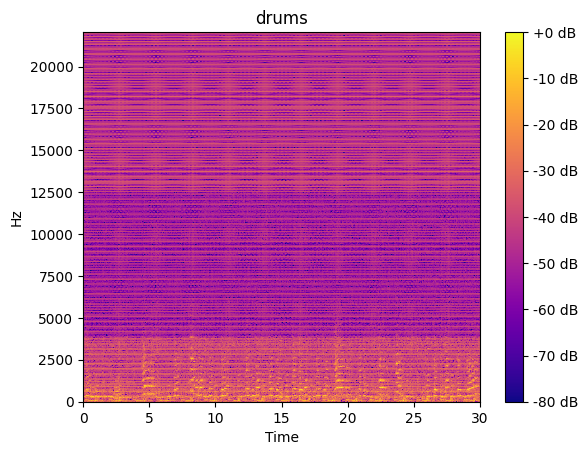

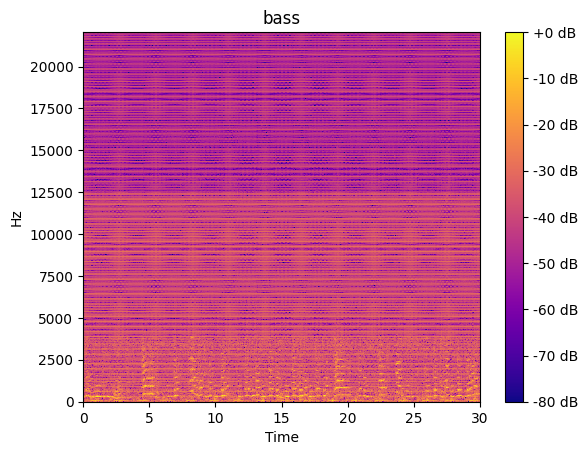

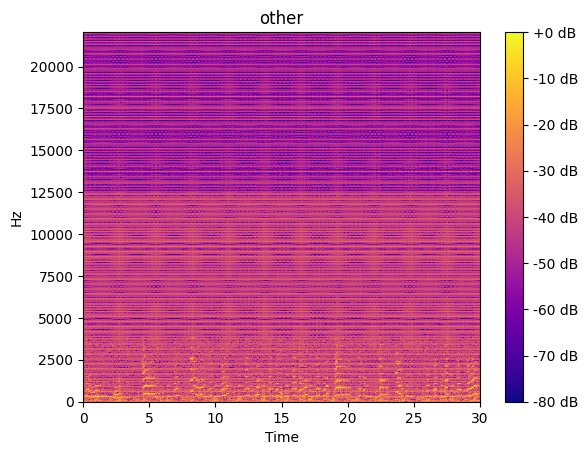

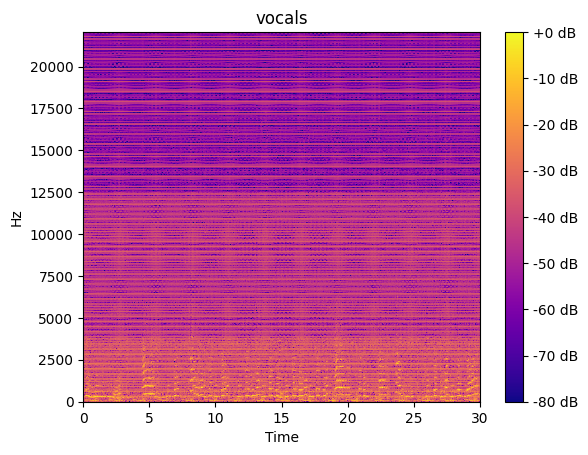

In [9]:

# Display the waveform before denormalization
import librosa.display
import matplotlib.pyplot as plt

def draw_spectro(waveform: np.ndarray, title: str = "Waveform"):
    fig, ax = plt.subplots()
    X = librosa.stft(waveform.mean(axis=-1))
    Xdb = librosa.amplitude_to_db(np.abs(X), ref=np.max)
    img = librosa.display.specshow(
        Xdb,
        cmap='plasma',
        sr=sample_rate,
        x_axis='time',
        y_axis='linear',
        ax=ax
    )
    ax.set(title=title)
    fig.colorbar(img, ax=ax, format="%+2.f dB")
    plt.show()

for instr in instruments:
    wav = waveforms_orig[instr]
    
    draw_spectro(wav.T, title=instr)

In [12]:
output_dir = "./output"
is_denormalized = {i: False for i in instruments}
os.makedirs(output_dir, exist_ok=True)
for instr in instruments:
    estimates = waveforms_orig[instr]
    if 'normalize' in config.inference:
        if config.inference['normalize'] is True and not is_denormalized[instr]:
            # denormalize the audio
            print(f"Denormalizing {instr}...")
            is_denormalized[instr] = True
            estimates = denormalize_audio(estimates, norm_params)
    output_file = os.path.join(output_dir, f"{instr}.wav")
    sf.write(output_file, estimates.T, sr, subtype="PCM_16")
    print(f"Saved {output_file}")

Denormalizing drums...
Saved ./output/drums.wav
Denormalizing bass...
Saved ./output/bass.wav
Denormalizing other...
Saved ./output/other.wav
Denormalizing vocals...
Saved ./output/vocals.wav


In [29]:
# use ipython display audio to play the audio
from IPython.display import Audio
for instr in instruments:
    estimates = waveforms_orig[instr]
    Audio(estimates.T, rate=sample_rate)

error: ushort format requires 0 <= number <= (32767 *2 +1)

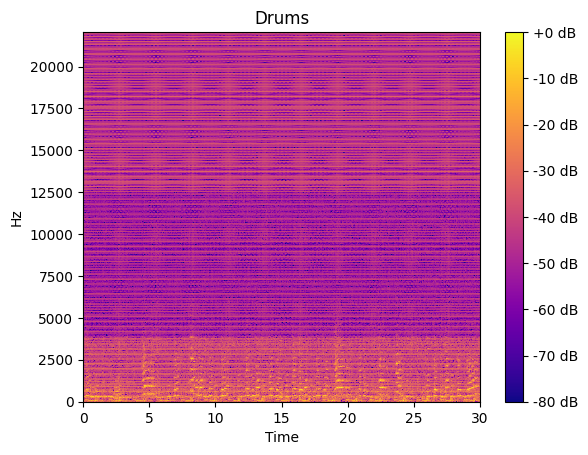

In [ ]:
waveforms_orig["drums"].shape
# display the waveform
